Working Code

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [2]:
import pathlib
image_dir = "D:/Masters/Fall 2023/ME 453/Topic 1 Data/Topic 1 Data/train"
data_dir = pathlib.Path(image_dir).with_suffix('')

In [3]:
image_count = len(list(data_dir.glob('*/*.jpeg')))
print(image_count)

1174


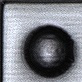

In [4]:
good = list(data_dir.glob('good/*'))
PIL.Image.open(str(good[0]))

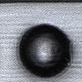

In [5]:
PIL.Image.open(str(good[1]))

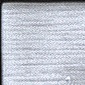

In [6]:
uncured = list(data_dir.glob('uncured/*'))
PIL.Image.open(str(uncured[0]))

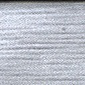

In [7]:
PIL.Image.open(str(uncured[1]))

Create a dataset

In [8]:
#Define some parameters for the loader:
batch_size = 32
img_height = 180
img_width = 180

In [9]:
#It's good practice to use a validation split when developing your model. 
#Use 80% of the images for training and 20% for validation.

train_ds = tf.keras.utils.image_dataset_from_directory(data_dir,validation_split=0.2,subset="training",seed=123,
                                                       image_size=(img_height, img_width),batch_size=batch_size)

Found 1174 files belonging to 4 classes.
Using 940 files for training.


In [10]:
val_ds = tf.keras.utils.image_dataset_from_directory(data_dir,validation_split=0.2, subset="validation",seed=123,
                                                     image_size=(img_height, img_width),batch_size=batch_size)

Found 1174 files belonging to 4 classes.
Using 234 files for validation.


In [11]:
class_names = train_ds.class_names
print(class_names)

['damaged', 'good', 'minor_damaged', 'uncured']


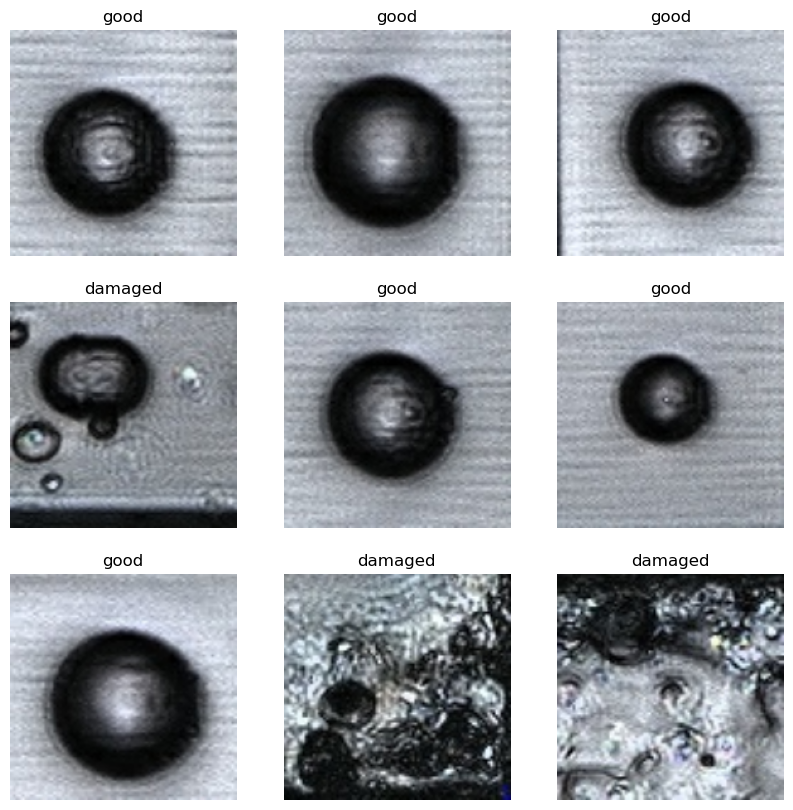

In [12]:
#Here are the first nine images from the training dataset:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [13]:
#You will pass these datasets to the Keras Model.fit method for training 
image_batch, labels_batch = next(iter(train_ds))
print(image_batch.shape, labels_batch.shape)

(32, 180, 180, 3) (32,)


The image_batch is a tensor of the shape (32, 180, 180, 3). This is a batch of 32 images of shape 180x180x3 (the last dimension refers to color channels RGB). The label_batch is a tensor of the shape (32,), these are corresponding labels to the 32 images

You can call .numpy() on the image_batch and labels_batch tensors to convert them to a numpy.ndarray.

## Configure the dataset for performance

Make sure to use buffered prefetching, so you can yield data from disk without having I/O become blocking. These are two important methods you should use when loading data:

Dataset.cache keeps the images in memory after they're loaded off disk during the first epoch. This will ensure the dataset does not become a bottleneck while training your model. If your dataset is too large to fit into memory, you can also use this method to create a performant on-disk cache.
Dataset.prefetch overlaps data preprocessing and model execution while training.

In [14]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size = AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size = AUTOTUNE)

## Standardize the data
The RGB channel values are in the [0, 255] range. This is not ideal for a neural network; in general you should seek to make your input values small.

Here, you will standardize values to be in the [0, 1] range by using tf.keras.layers.Rescaling:

In [15]:
normalization_layer = layers.Rescaling(1./255)

There are two ways to use this layer. You can apply it to the dataset by calling Dataset.map:

In [16]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0028976293 0.98598224


## A basic Keras model

## Create the model

The Keras Sequential model consists of three convolution blocks (tf.keras.layers.Conv2D) with a max pooling layer (tf.keras.layers.MaxPooling2D) in each of them. There's a fully-connected layer (tf.keras.layers.Dense) with 128 units on top of it that is activated by a ReLU activation function ('relu'). This model has not been tuned for high accuracy; the goal of this tutorial is to show a standard approach.

In [17]:
num_classes = len(class_names)

model = Sequential([layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
                    layers.Conv2D(16, 3, padding ='same', activation ='relu'),
                    layers.MaxPooling2D(),
                    layers.Conv2D(32, 3, padding ='same', activation ='relu'),
                    layers.MaxPooling2D(),
                    layers.Conv2D(64, 3, padding ='same', activation ='relu'),
                    layers.MaxPooling2D(),
                    layers.Flatten(),
                    layers.Dense(128, activation ='relu'),
                    layers.Dense(num_classes)])

## Compile the model
For this tutorial, choose the tf.keras.optimizers.Adam optimizer and tf.keras.losses.SparseCategoricalCrossentropy loss function. To view training and validation accuracy for each training epoch, pass the metrics argument to Model.compile.

In [18]:
model.compile(optimizer='adam',loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

## Model summary
View all the layers of the network using the Keras Model.summary method:

In [19]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 90, 90, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 45, 45, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 45, 45, 64)        1

## Train the model
Train the model for 10 epochs with the Keras Model.fit method:

In [20]:
epochs = 10
history = model.fit(train_ds, validation_data = val_ds, epochs = epochs)

Epoch 1/10


30/30 [==============================] - 6s 144ms/step - loss: 1.0499 - accuracy: 0.6489 - val_loss: 0.4215 - val_accuracy: 0.8803
Epoch 2/10
30/30 [==============================] - 4s 129ms/step - loss: 0.4104 - accuracy: 0.8372 - val_loss: 0.2311 - val_accuracy: 0.9103
Epoch 3/10
30/30 [==============================] - 4s 130ms/step - loss: 0.3134 - accuracy: 0.8681 - val_loss: 0.1801 - val_accuracy: 0.9402
Epoch 4/10
30/30 [==============================] - 4s 128ms/step - loss: 0.2338 - accuracy: 0.8883 - val_loss: 0.1668 - val_accuracy: 0.9274
Epoch 5/10
30/30 [==============================] - 5s 150ms/step - loss: 0.1626 - accuracy: 0.9319 - val_loss: 0.1584 - val_accuracy: 0.9359
Epoch 6/10
30/30 [==============================] - 5s 153ms/step - loss: 0.1633 - accuracy: 0.9340 - val_loss: 0.2411 - val_accuracy: 0.9017
Epoch 7/10
30/30 [==============================] - 5s 151ms/step - loss: 0.0975 - accuracy: 0.9638 - val_loss: 0.1685 - val_accuracy: 0.9145
Epoc

## Visualize training results
Create plots of the loss and accuracy on the training and validation sets:

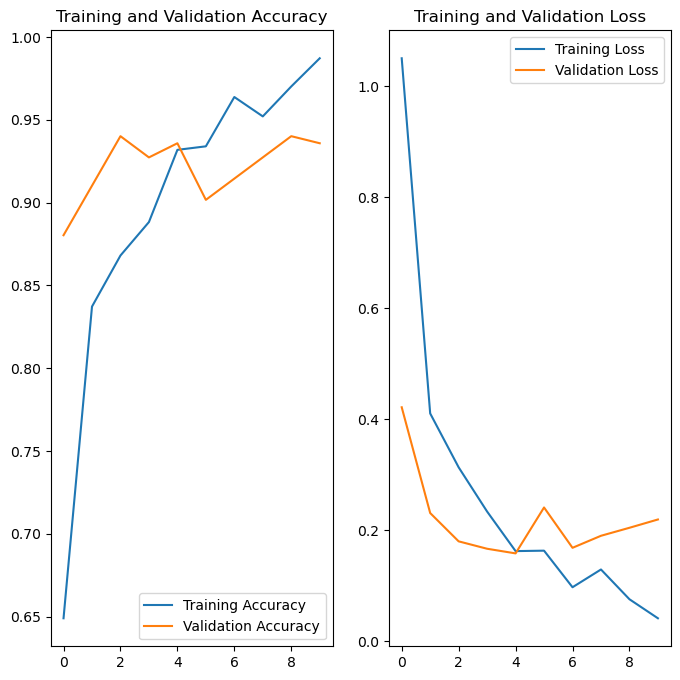

,Epochs,Training Accuracy,Validation Accuracy,Training Loss,Validation Loss
0,0,0.648936,0.880342,1.049875,0.421535
1,1,0.837234,0.910256,0.410430,0.231105
2,2,0.868085,0.940171,0.313417,0.180117
3,3,0.888298,0.927350,0.233763,0.166798
4,4,0.931915,0.935897,0.162564,0.158444
5,5,0.934043,0.901709,0.163346,0.241105
6,6,0.963830,0.914530,0.097498,0.168498
7,7,0.952128,0.927350,0.129472,0.190144
8,8,0.970213,0.940171,0.075877,0.204556
9,9,0.987234,0.935897,0.041618,0.219494


In [21]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize = (8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label ='Training Accuracy')
plt.plot(epochs_range, val_acc, label ='Validation Accuracy')
plt.legend(loc ='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label ='Training Loss')
plt.plot(epochs_range, val_loss, label ='Validation Loss')
plt.legend(loc ='upper right')
plt.title('Training and Validation Loss')
plt.show()

import pandas as pd

# Assuming acc, val_acc, loss, val_loss, and epochs_range are defined

data = {'Epochs': epochs_range, 'Training Accuracy': acc, 'Validation Accuracy': val_acc,
        'Training Loss': loss, 'Validation Loss': val_loss}
df = pd.DataFrame(data)

# Display the table
df

#### Based on the provided statistics, we can make observations regarding overfitting or underfitting:

Training Accuracy vs. Validation Accuracy:

Training accuracy steadily increases with each epoch, reaching a very high value (around 97.8%) by the last epoch.
Validation accuracy also improves initially but starts to plateau around epoch 6.
There is a noticeable gap between training and validation accuracy, suggesting that the model may be overfitting the training data.

Training Loss vs. Validation Loss:

Training loss consistently decreases with each epoch, indicating that the model is learning well from the training data.
Validation loss decreases initially but begins to show signs of increasing around epoch 6.
The increasing gap between training and validation loss further suggests overfitting.

General Observation:

The model's performance on the training data is significantly better than on the validation data, indicating overfitting.
Overfitting occurs when the model learns the training data too well, capturing noise and outliers that may not be representative of the overall dataset. As a result, the model's performance on new, unseen data (validation data) is compromised.

Recommendation:

To address overfitting, techniques such as dropout, regularization, or using more training data can be considered. It may also be beneficial to monitor the model's performance on a separate test set.

#### Overfitting
In the plots above, the training accuracy is increasing linearly over time, whereas validation accuracy stalls around 60% in the training process. Also, the difference in accuracy between training and validation accuracy is noticeable—a sign of overfitting.

When there are a small number of training examples, the model sometimes learns from noises or unwanted details from training examples—to an extent that it negatively impacts the performance of the model on new examples. This phenomenon is known as overfitting. It means that the model will have a difficult time generalizing on a new dataset.

There are multiple ways to fight overfitting in the training process. In this tutorial, you'll use data augmentation and add dropout to your model.

## Data augmentation
Overfitting generally occurs when there are a small number of training examples. Data augmentation takes the approach of generating additional training data from your existing examples by augmenting them using random transformations that yield believable-looking images. This helps expose the model to more aspects of the data and generalize better.

You will implement data augmentation using the following Keras preprocessing layers: tf.keras.layers.RandomFlip, tf.keras.layers.RandomRotation, and tf.keras.layers.RandomZoom. These can be included inside your model like other layers, and run on the GPU.

In [22]:
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal", input_shape=(img_height, img_width, 3)),
    layers.RandomRotation(20),  # Degrees
    layers.RandomZoom(0.2),
])

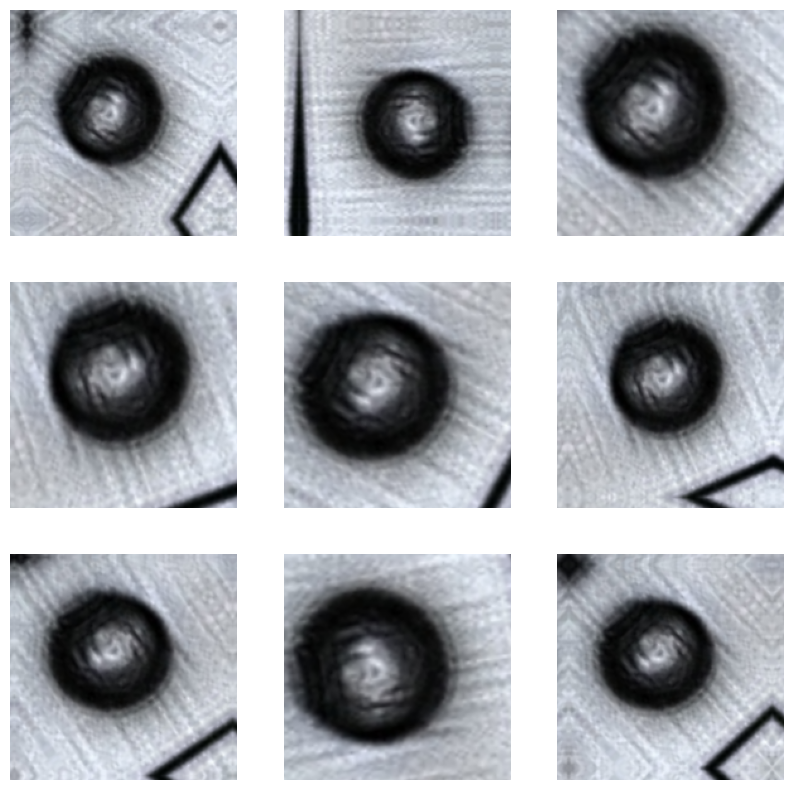

In [23]:
### Visualize a few augmented examples by applying data augmentation to the same image several times:

plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
    for i in range(9):
        augmented_images = data_augmentation(images)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[0].numpy().astype("uint8"))
        plt.axis("off")
    
### You will add data augmentation to your model before training in the next step.

### Dropout
Another technique to reduce overfitting is to introduce dropout regularization to the network.

When you apply dropout to a layer, it randomly drops out (by setting the activation to zero) a number of output units from the layer during the training process. Dropout takes a fractional number as its input value, in the form such as 0.1, 0.2, 0.4, etc. This means dropping out 10%, 20% or 40% of the output units randomly from the applied layer.

Create a new neural network with tf.keras.layers.Dropout before training it using the augmented images:

In [24]:
model = Sequential([data_augmentation, layers.Rescaling(1./255),
                    layers.Conv2D(16, 3, padding ='same', activation='relu'),
                    layers.MaxPooling2D(),
                    layers.Conv2D(32, 3, padding ='same', activation='relu'),
                    layers.MaxPooling2D(),
                    layers.Conv2D(64, 3, padding ='same', activation='relu'),
                    layers.MaxPooling2D(),
                    layers.Dropout(0.2),
                    layers.Flatten(),
                    layers.Dense(128, activation ='relu'),
                    layers.Dense(num_classes, name ="outputs")])

In [25]:
### Compile and train the model
model.compile(optimizer='adam', loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [26]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 180, 180, 3)       0         
                                                                 
 rescaling_2 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 90, 90, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 45, 45, 32)        0         
 g2D)                                                 

In [27]:
epochs = 20
history = model.fit(train_ds, validation_data = val_ds, epochs = epochs)

Epoch 1/20
30/30 [==============================] - 7s 179ms/step - loss: 0.9748 - accuracy: 0.6479 - val_loss: 0.4753 - val_accuracy: 0.8333
Epoch 2/20
30/30 [==============================] - 6s 186ms/step - loss: 0.5189 - accuracy: 0.7798 - val_loss: 0.3428 - val_accuracy: 0.8504
Epoch 3/20
30/30 [==============================] - 6s 187ms/step - loss: 0.4332 - accuracy: 0.8128 - val_loss: 0.2921 - val_accuracy: 0.8803
Epoch 4/20
30/30 [==============================] - 5s 181ms/step - loss: 0.4508 - accuracy: 0.8043 - val_loss: 0.3465 - val_accuracy: 0.8376
Epoch 5/20
30/30 [==============================] - 6s 187ms/step - loss: 0.4181 - accuracy: 0.8202 - val_loss: 0.3375 - val_accuracy: 0.8547
Epoch 6/20
30/30 [==============================] - 6s 184ms/step - loss: 0.4034 - accuracy: 0.8287 - val_loss: 0.2798 - val_accuracy: 0.8718
Epoch 7/20
30/30 [==============================] - 6s 186ms/step - loss: 0.3535 - accuracy: 0.8479 - val_loss: 0.3544 - val_accuracy: 0.8590
Epoch 

## Visualize training results
After applying data augmentation and tf.keras.layers.Dropout, there is less overfitting than before, and training and validation accuracy are closer aligned:

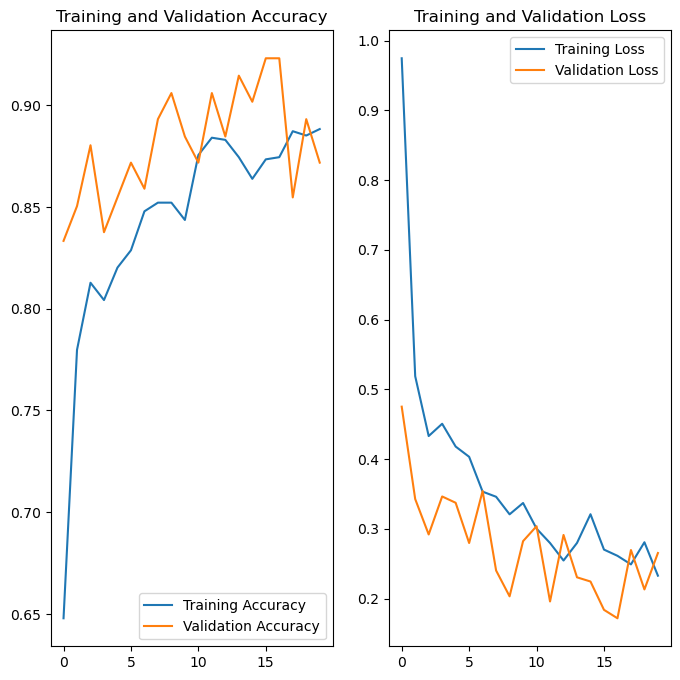

,Epochs,Training Accuracy,Validation Accuracy,Training Loss,Validation Loss
0,0,0.647872,0.833333,0.974757,0.475294
1,1,0.779787,0.850427,0.518944,0.342824
2,2,0.812766,0.880342,0.433161,0.292074
3,3,0.804255,0.837607,0.450781,0.346538
4,4,0.820213,0.854701,0.418096,0.337496
5,5,0.828723,0.871795,0.403406,0.279810
6,6,0.847872,0.858974,0.353456,0.354360
7,7,0.852128,0.893162,0.346117,0.240411
8,8,0.852128,0.905983,0.320939,0.203368
9,9,0.843617,0.884615,0.337188,0.282484


In [28]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

# Plotting
plt.figure(figsize = (8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label ='Training Accuracy')
plt.plot(epochs_range, val_acc, label ='Validation Accuracy')
plt.legend(loc ='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label ='Training Loss')
plt.plot(epochs_range, val_loss, label ='Validation Loss')
plt.legend(loc ='upper right')
plt.title('Training and Validation Loss')
plt.show()

data2 = {'Epochs': epochs_range, 'Training Accuracy': acc, 'Validation Accuracy': val_acc,
        'Training Loss': loss, 'Validation Loss': val_loss}
df2 = pd.DataFrame(data2)

# Display the table
df2

Based on the provided training and validation statistics, it seems that the model is not clearly overfitting or underfitting, but there are a few observations to consider:

Training Accuracy and Validation Accuracy:

The training accuracy starts at 71.49% and increases to around 90.96% by the 15th epoch.
The validation accuracy starts at 84.62% and increases to around 91.45% by the 15th epoch.
Training Loss and Validation Loss:

The training loss starts at 0.7449 and decreases to around 0.1986 by the 15th epoch.
The validation loss starts at 0.4096 and decreases to around 0.1714 by the 15th epoch.
Comparison:

Both training and validation accuracies are improving, and both training and validation losses are decreasing. This indicates that the model is learning from the data.
The training and validation metrics are relatively close, and there is no significant gap between them.
Stability:

The model appears to be stable, as there are no drastic fluctuations in accuracy or loss between epochs.
Considering these observations, the model seems to be well-fitted to the data, and there is no clear evidence of overfitting or underfitting. However, it's always a good practice to monitor the model's performance on unseen data or test data to get a more comprehensive assessment. If the training accuracy continues to increase while the validation accuracy plateaus or decreases, it might indicate overfitting. If both training and validation metrics are not improving, it might indicate underfitting.

## Rough code to detect classes in the test images

1/1 [==============================] - 0s 31ms/step
Image: 1.PNG, Labels: {(0, 0): 'good', (0, 1): 'good', (0, 2): 'good', (0, 3): 'minor_damaged', (0, 4): 'minor_damaged', (1, 0): 'good', (1, 1): 'good', (1, 2): 'good', (1, 3): 'good', (1, 4): 'good', (2, 0): 'good', (2, 1): 'good', (2, 2): 'minor_damaged', (2, 3): 'minor_damaged', (2, 4): 'good', (3, 0): 'good', (3, 1): 'good', (3, 2): 'good', (3, 3): 'good', (3, 4): 'good', (4, 0): 'good', (4, 1): 'good', (4, 2): 'good', (4, 3): 'good', (4, 4): 'good'}
Cumulative Results: {'damaged': 0, 'good': 21, 'minor_damaged': 4, 'uncured': 0}
1/1 [==============================] - 0s 32ms/step
Image: 10.PNG, Labels: {(0, 0): 'damaged', (0, 1): 'damaged', (0, 2): 'good', (0, 3): 'good', (0, 4): 'minor_damaged', (1, 0): 'damaged', (1, 1): 'good', (1, 2): 'good', (1, 3): 'good', (1, 4): 'good', (2, 0): 'good', (2, 1): 'good', (2, 2): 'good', (2, 3): 'good', (2, 4): 'good', (3, 0): 'good', (3, 1): 'damaged', (3, 2): 'good', (3, 3): 'good', (3, 4):

1/1 [==============================] - 0s 19ms/step
Image: 13.PNG, Labels: {(0, 0): 'minor_damaged', (0, 1): 'damaged', (0, 2): 'damaged', (0, 3): 'damaged', (0, 4): 'minor_damaged', (1, 0): 'damaged', (1, 1): 'damaged', (1, 2): 'minor_damaged', (1, 3): 'minor_damaged', (1, 4): 'minor_damaged', (2, 0): 'damaged', (2, 1): 'good', (2, 2): 'good', (2, 3): 'good', (2, 4): 'minor_damaged', (3, 0): 'minor_damaged', (3, 1): 'good', (3, 2): 'good', (3, 3): 'good', (3, 4): 'good', (4, 0): 'damaged', (4, 1): 'good', (4, 2): 'good', (4, 3): 'good', (4, 4): 'good'}
Cumulative Results: {'damaged': 7, 'good': 11, 'minor_damaged': 7, 'uncured': 0}
1/1 [==============================] - 0s 16ms/step
Image: 14.PNG, Labels: {(0, 0): 'damaged', (0, 1): 'good', (0, 2): 'good', (0, 3): 'good', (0, 4): 'minor_damaged', (1, 0): 'good', (1, 1): 'good', (1, 2): 'good', (1, 3): 'good', (1, 4): 'good', (2, 0): 'minor_damaged', (2, 1): 'good', (2, 2): 'good', (2, 3): 'good', (2, 4): 'good', (3, 0): 'good', (3, 1)

1/1 [==============================] - 0s 22ms/step
Image: 4.PNG, Labels: {(0, 0): 'good', (0, 1): 'good', (0, 2): 'good', (0, 3): 'good', (0, 4): 'good', (1, 0): 'good', (1, 1): 'good', (1, 2): 'good', (1, 3): 'good', (1, 4): 'minor_damaged', (2, 0): 'good', (2, 1): 'good', (2, 2): 'good', (2, 3): 'good', (2, 4): 'good', (3, 0): 'good', (3, 1): 'good', (3, 2): 'good', (3, 3): 'good', (3, 4): 'good', (4, 0): 'good', (4, 1): 'good', (4, 2): 'good', (4, 3): 'good', (4, 4): 'good'}
Cumulative Results: {'damaged': 0, 'good': 24, 'minor_damaged': 1, 'uncured': 0}
1/1 [==============================] - 0s 19ms/step
Image: 5.PNG, Labels: {(0, 0): 'damaged', (0, 1): 'good', (0, 2): 'good', (0, 3): 'good', (0, 4): 'good', (1, 0): 'good', (1, 1): 'good', (1, 2): 'good', (1, 3): 'good', (1, 4): 'good', (2, 0): 'good', (2, 1): 'good', (2, 2): 'good', (2, 3): 'good', (2, 4): 'good', (3, 0): 'good', (3, 1): 'good', (3, 2): 'good', (3, 3): 'good', (3, 4): 'good', (4, 0): 'good', (4, 1): 'good', (4, 2

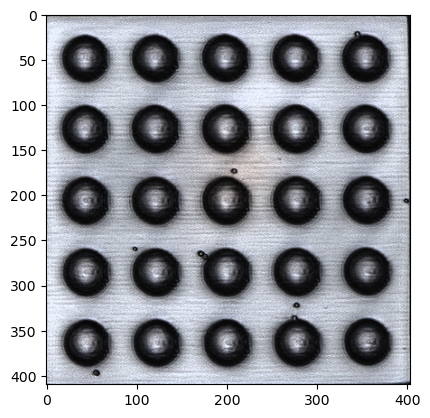

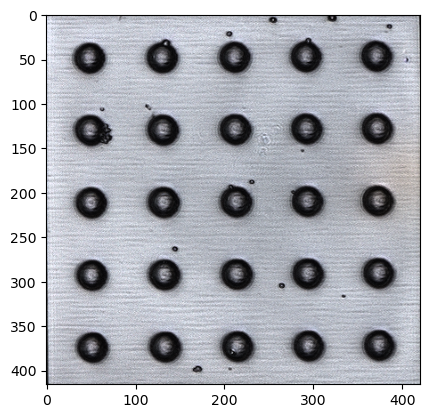

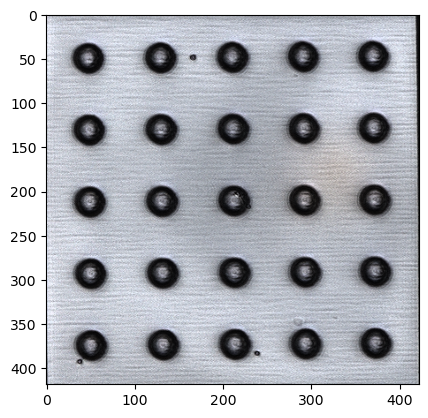

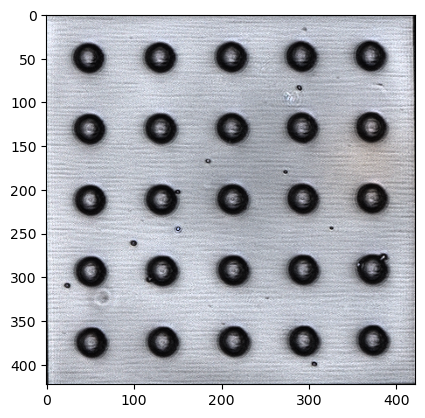

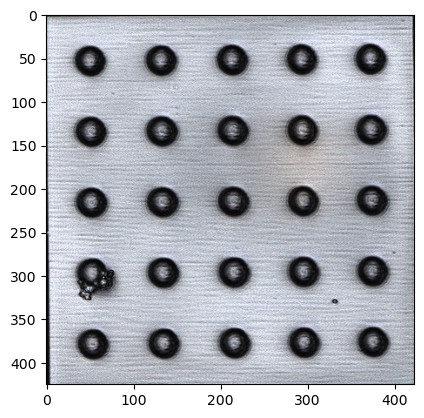

...

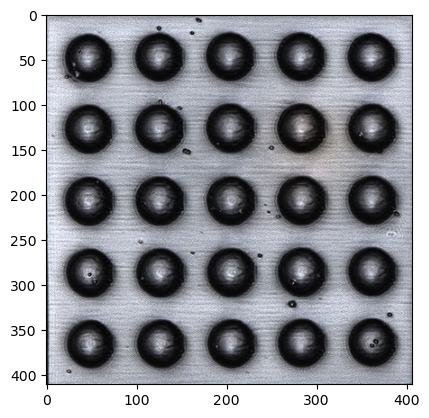

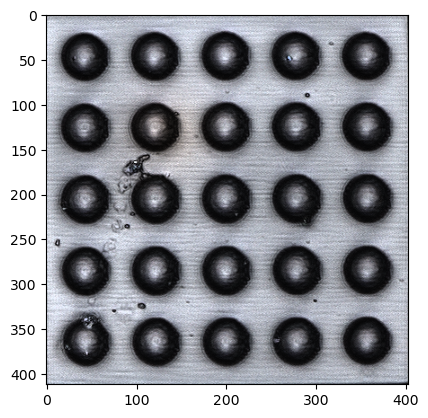

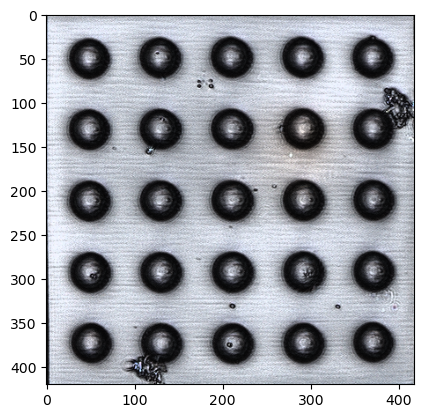

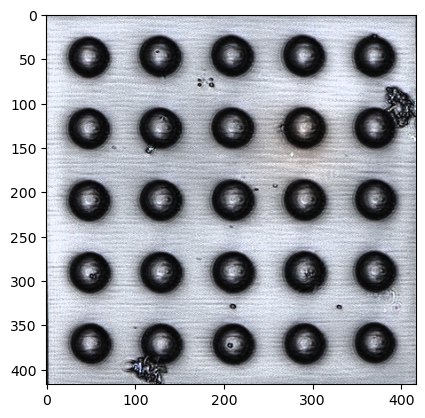

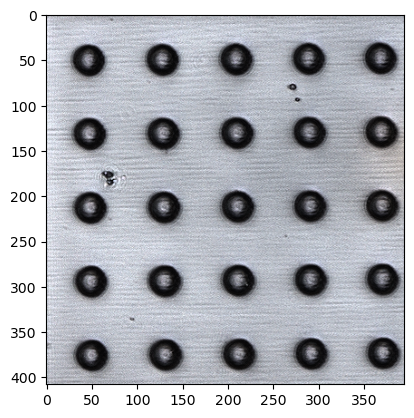

In [29]:
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
from tensorflow.keras.preprocessing import image
import matplotlib.patches as patches


# Replace with your actual class names
class_names = ['damaged', 'good', 'minor_damaged', 'uncured']

# Function to preprocess an image for model prediction
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(180, 180))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Function to preprocess a window for model input
def preprocess_image_from_window(window):
    window = tf.image.resize(window, (180, 180))
    window = np.expand_dims(window, axis=0)
    return window

# Function to classify an image using a 5x5 grid approach and collect labels in a dictionary
def classify_image_with_grid(img_path, grid_size=5):
    # Load the image
    img = cv2.imread(img_path)
    img_array = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_width, img_height, _ = img_array.shape

    # Determine the grid size to ensure it is 5x5
    grid_size = 5
    cell_width = img_width // grid_size
    cell_height = img_height // grid_size

    # Initialize a dictionary to store labels for each grid cell
    grid_labels = {}
    
    # Initialize an array to store class probabilities for each grid cell
    grid_probs = np.zeros((grid_size, grid_size, len(class_names)))

    # Create a figure for visualization
    fig, ax = plt.subplots(1)
    ax.imshow(img_array.astype(int))

    # Iterate through the image with a sliding window
    for i in range(grid_size):
        for j in range(grid_size):
            # Calculate the starting pixel coordinates (top-left corner of each cell)
            start_x = j * cell_width
            start_y = i * cell_height

            # Extract the current window
            window = img_array[start_y:start_y + cell_height, start_x:start_x + cell_width, :]

            # Check if the window is empty
            if window.size == 0:
                continue

            # Preprocess the window for model input
            window = preprocess_image_from_window(window)

            # Make a prediction for the current window
            predictions = model.predict(window)

            # Get the label for the current cell
            cell_label = class_names[np.argmax(predictions)]

            # Store the label in the dictionary with the position as the key
            grid_labels[(i, j)] = cell_label

    return grid_labels

# Test the classification on each image in the test directory
test_dir = "D:/Masters/Fall 2023/ME 453/Topic 1 Data/Topic 1 Data/test"
cumulative_results = {}


for filename in os.listdir(test_dir):
    if filename.endswith(".PNG"):  # Assuming images are in PNG format
        cumulative_results = {class_name: 0 for class_name in class_names}
        img_path = os.path.join(test_dir, filename)

        # Classify the image using the 5x5 grid approach and collect labels
        labels = classify_image_with_grid(img_path, grid_size=5)

        # Update cumulative results after processing each image
        for class_name in class_names:
            cumulative_results[class_name] += list(labels.values()).count(class_name)

        # Print the labels for each grid cell
        print(f"Image: {filename}, Labels: {labels}")

    # Print cumulative results after processing each image
        print("Cumulative Results:", cumulative_results)


1/1 [==============================] - 0s 30ms/step


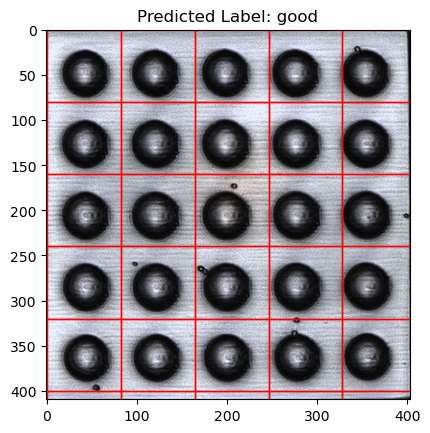

1/1 [==============================] - 0s 33ms/step


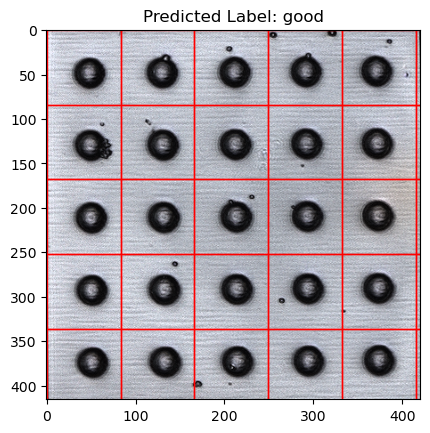

1/1 [==============================] - 0s 27ms/step


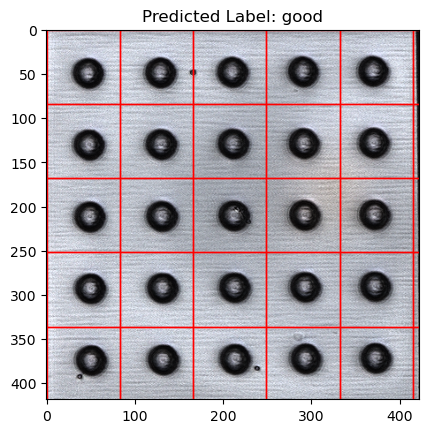

1/1 [==============================] - 0s 41ms/step


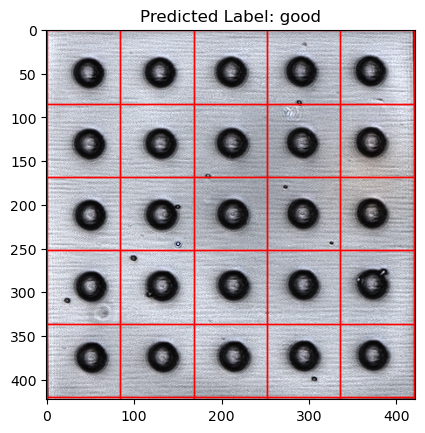

1/1 [==============================] - 0s 33ms/step


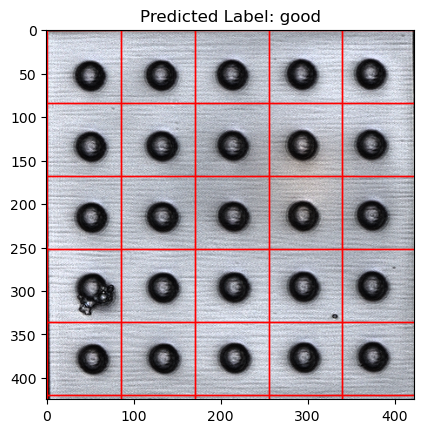

1/1 [==============================] - 0s 17ms/step


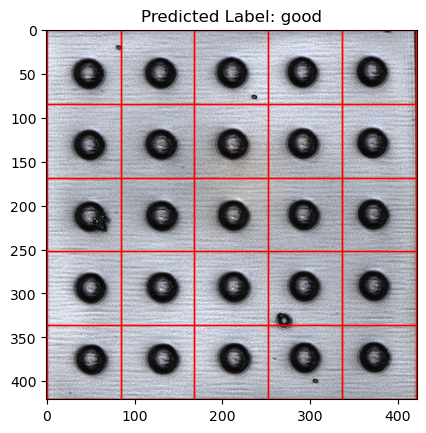

1/1 [==============================] - 0s 32ms/step


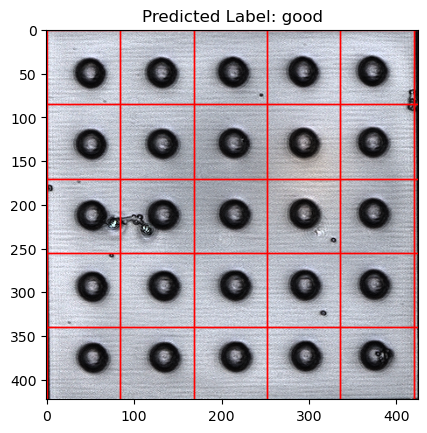

1/1 [==============================] - 0s 31ms/step


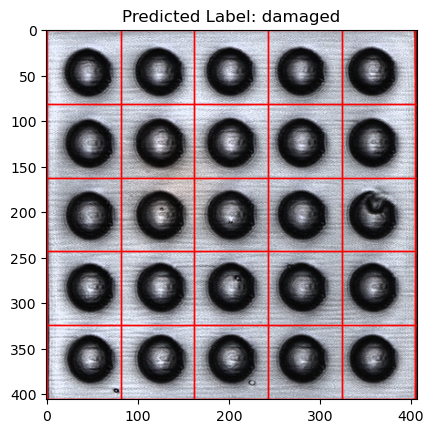

1/1 [==============================] - 0s 23ms/step


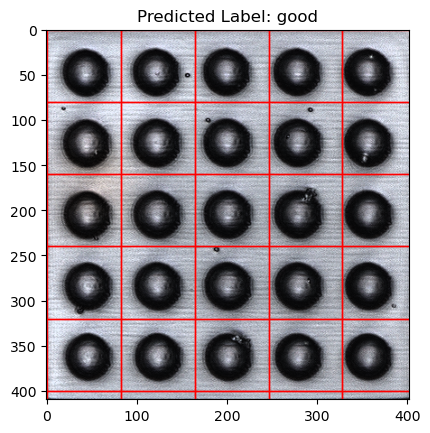

1/1 [==============================] - 0s 39ms/step


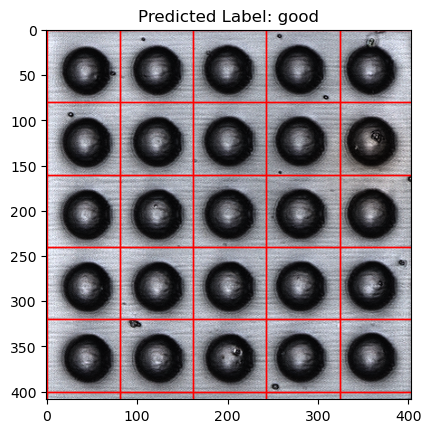

1/1 [==============================] - 0s 29ms/step


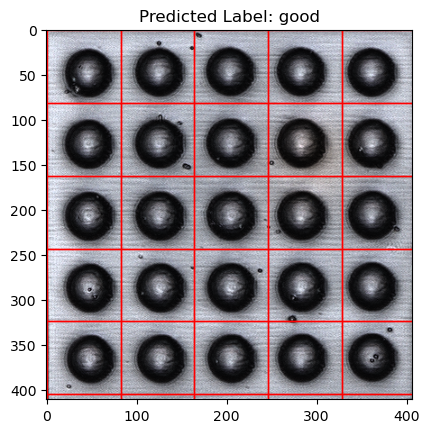

1/1 [==============================] - 0s 25ms/step


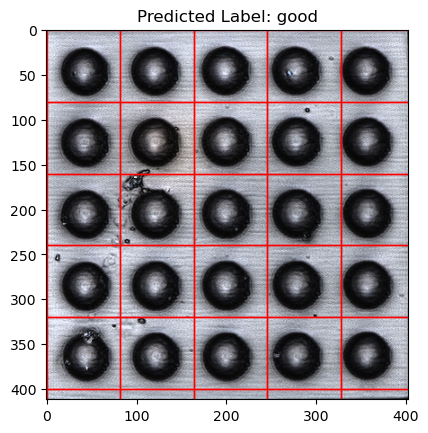

1/1 [==============================] - 0s 28ms/step


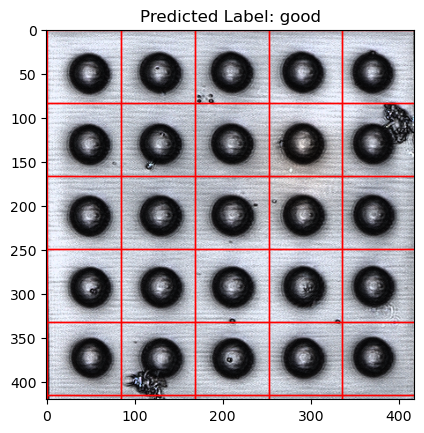

1/1 [==============================] - 0s 26ms/step


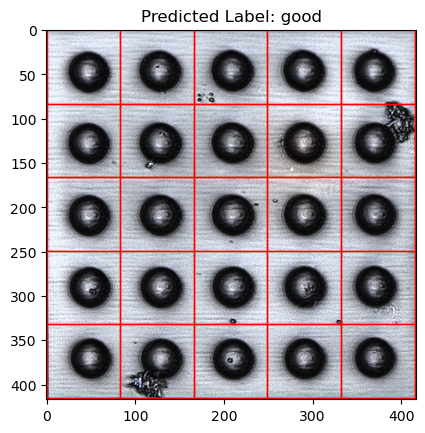

1/1 [==============================] - 0s 21ms/step


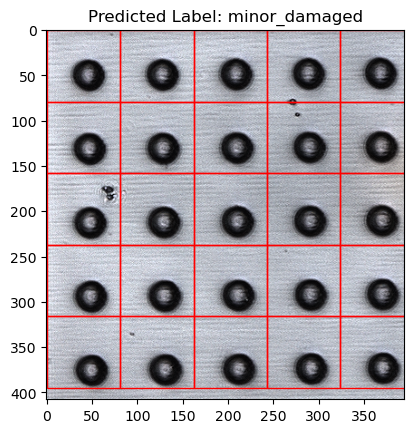

In [30]:
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
from tensorflow.keras.preprocessing import image
import matplotlib.patches as patches

# Replace with the path to your model file
# model_path = "path/to/your_model.h5"
# model = tf.keras.models.load_model(model_path)

# Replace with your actual class names
class_names = ['damaged', 'good', 'minor_damaged', 'uncured']

# Function to preprocess an image for model prediction
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(180, 180))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Function to preprocess a window for model input
def preprocess_image_from_window(window):
    window = tf.image.resize(window, (180, 180))
    window = np.expand_dims(window, axis=0)
    return window

# Function to classify an image using a 5x5 grid approach and display the grid
def classify_image_with_grid(img_path, grid_size=5):
    # Load the image
    img = cv2.imread(img_path)
    img_array = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_width, img_height, _ = img_array.shape

    # Determine the grid size to ensure it is 5x5
    grid_size = 5
    cell_width = img_width // grid_size
    cell_height = img_height // grid_size

    # Initialize an array to store class probabilities for each grid cell
    grid_probs = np.zeros((grid_size, grid_size, len(class_names)))

    # Create a figure for visualization
    fig, ax = plt.subplots(1)
    ax.imshow(img_array.astype(int))

    # Iterate through the image with a sliding window
    for y in range(0, img_height, cell_height):
        for x in range(0, img_width, cell_width):
            # Extract the current window
            window = img_array[y:y + cell_height, x:x + cell_width, :]

            # Check if the window is empty 
            if window.size == 0:
                continue

            # Preprocess the window for model input
            window = preprocess_image_from_window(window)

            # Make a prediction for the current window
            predictions = model.predict(window)

            # Store the class probabilities in the grid_probs array
            grid_probs[y // cell_height % grid_size, x // cell_width % grid_size, :] = predictions

            # Display the bounding box for the current grid cell
            rect = patches.Rectangle((x, y), cell_width, cell_height,
                                     linewidth=1, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

    # Calculate the average probability across all grid cells for each class
    avg_probs = np.mean(grid_probs, axis=(0, 1))

    # Assign the label based on the class with the highest average probability
    predicted_label = class_names[np.argmax(avg_probs)]

    # Display the result
    plt.title(f"Predicted Label: {predicted_label}")
    plt.show()

# Test the classification on each image in the test directory with grid visualization
test_dir = "D:/Masters/Fall 2023/ME 453/Topic 1 Data/Topic 1 Data/test"
for filename in os.listdir(test_dir):
    if filename.endswith(".PNG"):  # Assuming images are in PNG format
        img_path = os.path.join(test_dir, filename)

        # Classify the image using the 5x5 grid approach and display the grid
        classify_image_with_grid(img_path, grid_size=5)


In [31]:
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
from tensorflow.keras.preprocessing import image
import matplotlib.patches as patches

# # Replace with the path to your model file
# model_path = "path/to/your_model.h5"
# model = tf.keras.models.load_model(model_path)

# Replace with your actual class names
class_names = ['damaged', 'good', 'minor_damaged', 'uncured']

# Function to preprocess an image for model prediction
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(180, 180))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Function to preprocess a window for model input
def preprocess_image_from_window(window):
    window = tf.image.resize(window, (180, 180))
    window = np.expand_dims(window, axis=0)
    return window

# Function to classify an image using a 5x5 grid approach and collect labels in a dictionary
def classify_image_with_grid(img_path, grid_size=5):
    # Load the image
    img = cv2.imread(img_path)
    img_array = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_width, img_height, _ = img_array.shape

    # Determine the grid size to ensure it is 5x5
    grid_size = 5
    cell_width = img_width // grid_size
    cell_height = img_height // grid_size

    # Initialize a dictionary to store labels for each grid cell
    grid_labels = {}

    # Iterate through the image with a sliding window
    for i in range(grid_size):
        for j in range(grid_size):
            # Calculate the starting pixel coordinates (top-left corner of each cell)
            start_x = j * cell_width
            start_y = i * cell_height

            # Extract the current window
            window = img_array[start_y:start_y + cell_height, start_x:start_x + cell_width, :]

            # Check if the window is empty
            if window.size == 0:
                continue

            # Preprocess the window for model input
            window = preprocess_image_from_window(window)

            # Make a prediction for the current window
            predictions = model.predict(window)

            # Get the label for the current cell
            cell_label = class_names[np.argmax(predictions)]

            # Store the label in the dictionary with the position as the key
            grid_labels[(i, j)] = cell_label

    return grid_labels

# Test the classification on each image in the test directory
test_dir = "D:/Masters/Fall 2023/ME 453/Topic 1 Data/Topic 1 Data/test"
for filename in os.listdir(test_dir):
    if filename.endswith(".PNG"):  # Assuming images are in PNG format
        img_path = os.path.join(test_dir, filename)

        # Classify the image using the 5x5 grid approach and collect labels
        labels = classify_image_with_grid(img_path, grid_size=5)

        # Print the labels for each grid cell
        print(f"Image: {filename}, Labels: {labels}")


1/1 [==============================] - 0s 26ms/step
Image: 1.PNG, Labels: {(0, 0): 'good', (0, 1): 'good', (0, 2): 'good', (0, 3): 'minor_damaged', (0, 4): 'minor_damaged', (1, 0): 'good', (1, 1): 'good', (1, 2): 'good', (1, 3): 'good', (1, 4): 'good', (2, 0): 'good', (2, 1): 'good', (2, 2): 'minor_damaged', (2, 3): 'minor_damaged', (2, 4): 'good', (3, 0): 'good', (3, 1): 'good', (3, 2): 'good', (3, 3): 'good', (3, 4): 'good', (4, 0): 'good', (4, 1): 'good', (4, 2): 'good', (4, 3): 'good', (4, 4): 'good'}
1/1 [==============================] - 0s 24ms/step
Image: 10.PNG, Labels: {(0, 0): 'damaged', (0, 1): 'damaged', (0, 2): 'good', (0, 3): 'good', (0, 4): 'minor_damaged', (1, 0): 'damaged', (1, 1): 'good', (1, 2): 'good', (1, 3): 'good', (1, 4): 'good', (2, 0): 'good', (2, 1): 'good', (2, 2): 'good', (2, 3): 'good', (2, 4): 'good', (3, 0): 'good', (3, 1): 'damaged', (3, 2): 'good', (3, 3): 'good', (3, 4): 'good', (4, 0): 'damaged', (4, 1): 'good', (4, 2): 'good', (4, 3): 'good', (4, 4

1/1 [==============================] - 0s 26ms/step
Image: 4.PNG, Labels: {(0, 0): 'good', (0, 1): 'good', (0, 2): 'good', (0, 3): 'good', (0, 4): 'good', (1, 0): 'good', (1, 1): 'good', (1, 2): 'good', (1, 3): 'good', (1, 4): 'minor_damaged', (2, 0): 'good', (2, 1): 'good', (2, 2): 'good', (2, 3): 'good', (2, 4): 'good', (3, 0): 'good', (3, 1): 'good', (3, 2): 'good', (3, 3): 'good', (3, 4): 'good', (4, 0): 'good', (4, 1): 'good', (4, 2): 'good', (4, 3): 'good', (4, 4): 'good'}
1/1 [==============================] - 0s 25ms/step
Image: 5.PNG, Labels: {(0, 0): 'damaged', (0, 1): 'good', (0, 2): 'good', (0, 3): 'good', (0, 4): 'good', (1, 0): 'good', (1, 1): 'good', (1, 2): 'good', (1, 3): 'good', (1, 4): 'good', (2, 0): 'good', (2, 1): 'good', (2, 2): 'good', (2, 3): 'good', (2, 4): 'good', (3, 0): 'good', (3, 1): 'good', (3, 2): 'good', (3, 3): 'good', (3, 4): 'good', (4, 0): 'good', (4, 1): 'good', (4, 2): 'good', (4, 3): 'good', (4, 4): 'good'}
1/1 [==============================] -